In [1]:
# Importing packages
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torchmetrics
import torchinfo
import torch.nn.functional as F
import cv2

In [2]:
# Data pathes
train_images = 'data/Massachusetts/tiff/train'
train_labels = 'data/Massachusetts/tiff/train_labels'
val_images = 'data/Massachusetts/tiff/val'
val_labels = 'data/Massachusetts/tiff/val_labels'
test_images = 'data/Massachusetts/tiff/test'
test_labels = 'data/Massachusetts/tiff/test_labels'

In [3]:
# Hyperparams
DEVICE = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
IN_CHANNELS = 3
CLASSES = 2
TRAIN_BATCH = 8
VALID_BATCH = 1
NUM_WORKERS = 8
LR = 0.001
EPOCHS = 200

In [4]:
# Train and test augmentations

A_train = A.Compose([#A.Resize(224, 224, interpolation=cv2.INTER_NEAREST), 
                     A.RandomCrop(height=256, width=256, always_apply=True),
                     A.OneOf([
                       A.VerticalFlip(p=1),
                       A.HorizontalFlip(p=1),
                       A.RandomRotate90(p=1)], p=1),  
#                     A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                     A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
                  ToTensorV2()])


A_val =  A.Compose([ #A.Resize(224, 224, interpolation=cv2.INTER_NEAREST),
                    A.PadIfNeeded(min_height=1504, min_width=1504, always_apply=True, border_mode=0),
                   A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
#                      A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                    
                   ToTensorV2()])

In [5]:
# Dataset class
class MassachussetsDataset(Dataset):
    def __init__(self, img_path, mask_path, transforms=None):
        super().__init__()
        self.img_path = img_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.images_list = os.listdir(img_path)

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, index):
        image = np.array(Image.open(os.path.join(self.img_path, self.images_list[index])).convert("RGB"))
        mask = np.array(Image.open(os.path.join(self.mask_path, self.images_list[index].replace('.tiff', '.tif'))).convert("L"), dtype=np.float32)
        mask[mask==255] = 1.0

        if self.transforms is not None:
            aug  = self.transforms(image=image, mask=mask)
            image = aug['image']
            mask = aug['mask']
            

        return image, mask

In [6]:
# Datasets and Dataloaders

train_set = MassachussetsDataset(train_images, train_labels, transforms=A_train)
valid_set = MassachussetsDataset(val_images, val_labels, transforms=A_val)
test_set = MassachussetsDataset(test_images, test_labels, transforms=A_val)


train_loader = DataLoader(train_set, shuffle=True, batch_size=TRAIN_BATCH, num_workers=NUM_WORKERS)
valid_loader = DataLoader(valid_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)
test_loader = DataLoader(test_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)

In [7]:
# def get_mean_and_std(dataloader):
#     channels_sum, channels_squared_sum, num_batches = 0, 0, 0
#     for data, _ in dataloader:
#         # Mean over batch, height and width, but not over the channels
#         channels_sum += torch.mean(data, dim=[0,2,3])
#         channels_squared_sum += torch.mean(data**2, dim=[0,2,3])
#         num_batches += 1
    
#     mean = channels_sum / num_batches

#     # std = sqrt(E[X^2] - (E[X])^2)
#     std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

#     return mean, std

# mean, std = get_mean_and_std(train_loader)

In [8]:
# print(mean)
# print(std)

In [9]:
img, mask = train_set[2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


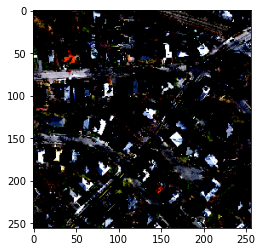

In [10]:
plt.imshow(img.permute(1, 2, 0))

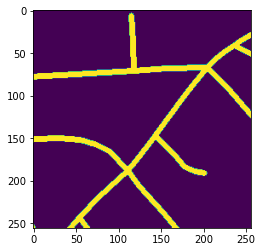

In [11]:
plt.imshow(mask)

In [12]:
print(np.unique(mask))

[0. 1.]


In [13]:
import torch
import torch.nn as nn

class batchnorm_relu(nn.Module):
    def __init__(self, in_c):
        super().__init__()

        self.bn = nn.BatchNorm2d(in_c)
        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.bn(inputs)
        x = self.relu(x)
        return x

class residual_block(nn.Module):
    def __init__(self, in_c, out_c, stride=1):
        super().__init__()

        """ Convolutional layer """
        self.b1 = batchnorm_relu(in_c)
        self.c1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1, stride=stride)
        self.b2 = batchnorm_relu(out_c)
        self.c2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1, stride=1)

        """ Shortcut Connection (Identity Mapping) """
        self.s = nn.Conv2d(in_c, out_c, kernel_size=1, padding=0, stride=stride)

    def forward(self, inputs):
        x = self.b1(inputs)
        x = self.c1(x)
        x = self.b2(x)
        x = self.c2(x)
        s = self.s(inputs)

        skip = x + s
        return skip

class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.upsample = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.r = residual_block(in_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.upsample(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.r(x)
        return x

class ResUnet(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder 1 """
        self.c11 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.br1 = batchnorm_relu(64)
        self.c12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.c13 = nn.Conv2d(3, 64, kernel_size=1, padding=0)

        """ Encoder 2 and 3 """
        self.r2 = residual_block(64, 128, stride=2)
        self.r3 = residual_block(128, 256, stride=2)

        """ Bridge """
        self.r4 = residual_block(256, 512, stride=2)

        """ Decoder """
        self.d1 = decoder_block(512, 256)
        self.d2 = decoder_block(256, 128)
        self.d3 = decoder_block(128, 64)

        """ Output """
        self.output = nn.Conv2d(64, 1, kernel_size=1, padding=0)
        self.sigmoid = nn.Sigmoid()

    def forward(self, inputs):
        """ Encoder 1 """
        x = self.c11(inputs)
        x = self.br1(x)
        x = self.c12(x)
        s = self.c13(inputs)
        skip1 = x + s

        """ Encoder 2 and 3 """
        skip2 = self.r2(skip1)
        skip3 = self.r3(skip2)

        """ Bridge """
        b = self.r4(skip3)

        """ Decoder """
        d1 = self.d1(b, skip3)
        d2 = self.d2(d1, skip2)
        d3 = self.d3(d2, skip1)

        """ output """
        output = self.output(d3)
#         output = self.sigmoid(output)

        return output

In [14]:
model = ResUnet().to(DEVICE)

In [15]:
# Custom loss functions
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice
    
#####################################################################################    
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE
#####################################################################################    
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU
    
#####################################################################################    
ALPHA = 0.8
GAMMA = 2

class FocalLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalLoss, self).__init__()

    def forward(self, inputs, targets, alpha=0.8, gamma=2, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #first compute binary cross-entropy 
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha * (1-BCE_EXP)**gamma * BCE
                       
        return focal_loss
    
    
#####################################################################################
ALPHA = 0.5
BETA = 0.5

class TverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(TverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, beta=BETA):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
       
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        
        return 1 - Tversky

In [16]:
# criterion = nn.BCEWithLogitsLoss().to(DEVICE)
# criterion = DiceLoss().to(DEVICE)
criterion = DiceBCELoss().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

In [17]:
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=CLASSES):
    with torch.no_grad():
        pred_mask = nn.functional.sigmoid(pred_mask)
        pred_mask = (pred_mask > 0.5).float()
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union + smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [18]:
def plot_images(img, mask, pred):
    f, ax = plt.subplots(1, 3)
    ax[0].imshow(img)
    ax[0].set_xlabel("Image")
    ax[1].imshow(mask)
    ax[1].set_xlabel("Ground Truth")
    ax[2].imshow(pred)
    ax[2].set_xlabel("Prediction")

  0%|          | 0/139 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.804, valid_miou=0.604]


Epoch-1 Train mean loss: 0.9928 Train MIOU: 0.5390
Epoch-1 Valid mean loss: 0.8632 Valid MIOU: 0.5840


100%|██████████| 7/7 [00:03<00:00,  1.79it/s, valid_loss=0.997, valid_miou=0.576]


Epoch-2 Train mean loss: 0.8968 Train MIOU: 0.5767
Epoch-2 Valid mean loss: 0.7883 Valid MIOU: 0.6210


100%|██████████| 7/7 [00:04<00:00,  1.72it/s, valid_loss=0.69, valid_miou=0.647] 


Epoch-3 Train mean loss: 0.8570 Train MIOU: 0.5883
Epoch-3 Valid mean loss: 0.7651 Valid MIOU: 0.6256


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.789, valid_miou=0.631]


Epoch-4 Train mean loss: 0.7960 Train MIOU: 0.6112
Epoch-4 Valid mean loss: 0.6930 Valid MIOU: 0.6547


100%|██████████| 7/7 [00:03<00:00,  1.77it/s, valid_loss=0.686, valid_miou=0.677]


Epoch-5 Train mean loss: 0.7677 Train MIOU: 0.6213
Epoch-5 Valid mean loss: 0.6922 Valid MIOU: 0.6619


100%|██████████| 7/7 [00:03<00:00,  1.77it/s, valid_loss=0.449, valid_miou=0.735]


Epoch-6 Train mean loss: 0.7159 Train MIOU: 0.6399
Epoch-6 Valid mean loss: 0.6072 Valid MIOU: 0.6922


100%|██████████| 7/7 [00:03<00:00,  1.79it/s, valid_loss=0.779, valid_miou=0.65] 


Epoch-7 Train mean loss: 0.6401 Train MIOU: 0.6715
Epoch-7 Valid mean loss: 0.5672 Valid MIOU: 0.7087


100%|██████████| 7/7 [00:03<00:00,  1.81it/s, valid_loss=0.651, valid_miou=0.673]


Epoch-8 Train mean loss: 0.6477 Train MIOU: 0.6694
Epoch-8 Valid mean loss: 0.5551 Valid MIOU: 0.7106


100%|██████████| 7/7 [00:04<00:00,  1.70it/s, valid_loss=0.526, valid_miou=0.732]


Epoch-9 Train mean loss: 0.6056 Train MIOU: 0.6846
Epoch-9 Valid mean loss: 0.5359 Valid MIOU: 0.7207


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.407, valid_miou=0.765]


Epoch-10 Train mean loss: 0.6082 Train MIOU: 0.6846
Epoch-10 Valid mean loss: 0.5273 Valid MIOU: 0.7248


100%|██████████| 7/7 [00:04<00:00,  1.57it/s, valid_loss=0.486, valid_miou=0.744]


Epoch-11 Train mean loss: 0.5806 Train MIOU: 0.6957
Epoch-11 Valid mean loss: 0.5399 Valid MIOU: 0.7222


100%|██████████| 7/7 [00:04<00:00,  1.67it/s, valid_loss=0.637, valid_miou=0.701]


Epoch-12 Train mean loss: 0.5644 Train MIOU: 0.7021
Epoch-12 Valid mean loss: 0.5090 Valid MIOU: 0.7308


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.537, valid_miou=0.735]


Epoch-13 Train mean loss: 0.5691 Train MIOU: 0.7016
Epoch-13 Valid mean loss: 0.5087 Valid MIOU: 0.7364


100%|██████████| 7/7 [00:04<00:00,  1.68it/s, valid_loss=0.472, valid_miou=0.73] 


Epoch-14 Train mean loss: 0.5596 Train MIOU: 0.7057
Epoch-14 Valid mean loss: 0.4974 Valid MIOU: 0.7349


100%|██████████| 7/7 [00:04<00:00,  1.68it/s, valid_loss=0.47, valid_miou=0.74]  


Epoch-15 Train mean loss: 0.5417 Train MIOU: 0.7112
Epoch-15 Valid mean loss: 0.5265 Valid MIOU: 0.7247


100%|██████████| 7/7 [00:04<00:00,  1.70it/s, valid_loss=0.503, valid_miou=0.731]


Epoch-16 Train mean loss: 0.5270 Train MIOU: 0.7189
Epoch-16 Valid mean loss: 0.4759 Valid MIOU: 0.7442


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.582, valid_miou=0.713]


Epoch-17 Train mean loss: 0.5293 Train MIOU: 0.7189
Epoch-17 Valid mean loss: 0.4830 Valid MIOU: 0.7474


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.395, valid_miou=0.775]


Epoch-18 Train mean loss: 0.5428 Train MIOU: 0.7120
Epoch-18 Valid mean loss: 0.4785 Valid MIOU: 0.7471


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.43, valid_miou=0.742] 


Epoch-19 Train mean loss: 0.5230 Train MIOU: 0.7218
Epoch-19 Valid mean loss: 0.4810 Valid MIOU: 0.7446


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.398, valid_miou=0.786]


Epoch-20 Train mean loss: 0.5337 Train MIOU: 0.7150
Epoch-20 Valid mean loss: 0.4594 Valid MIOU: 0.7504


100%|██████████| 7/7 [00:04<00:00,  1.70it/s, valid_loss=0.549, valid_miou=0.724]


Epoch-21 Train mean loss: 0.5292 Train MIOU: 0.7166
Epoch-21 Valid mean loss: 0.5004 Valid MIOU: 0.7349


100%|██████████| 7/7 [00:04<00:00,  1.65it/s, valid_loss=0.413, valid_miou=0.764]


Epoch-22 Train mean loss: 0.5123 Train MIOU: 0.7248
Epoch-22 Valid mean loss: 0.4904 Valid MIOU: 0.7378


100%|██████████| 7/7 [00:04<00:00,  1.61it/s, valid_loss=0.688, valid_miou=0.697]


Epoch-23 Train mean loss: 0.5346 Train MIOU: 0.7162
Epoch-23 Valid mean loss: 0.4687 Valid MIOU: 0.7520


100%|██████████| 7/7 [00:04<00:00,  1.66it/s, valid_loss=0.388, valid_miou=0.786]


Epoch-24 Train mean loss: 0.5183 Train MIOU: 0.7222
Epoch-24 Valid mean loss: 0.4514 Valid MIOU: 0.7587


100%|██████████| 7/7 [00:04<00:00,  1.68it/s, valid_loss=0.417, valid_miou=0.765]


Epoch-25 Train mean loss: 0.5109 Train MIOU: 0.7255
Epoch-25 Valid mean loss: 0.4706 Valid MIOU: 0.7466


100%|██████████| 7/7 [00:04<00:00,  1.66it/s, valid_loss=0.393, valid_miou=0.767]


Epoch-26 Train mean loss: 0.5108 Train MIOU: 0.7255
Epoch-26 Valid mean loss: 0.4494 Valid MIOU: 0.7567


100%|██████████| 7/7 [00:04<00:00,  1.67it/s, valid_loss=0.411, valid_miou=0.777]


Epoch-27 Train mean loss: 0.5094 Train MIOU: 0.7248
Epoch-27 Valid mean loss: 0.4656 Valid MIOU: 0.7490


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.386, valid_miou=0.766]


Epoch-28 Train mean loss: 0.5141 Train MIOU: 0.7219
Epoch-28 Valid mean loss: 0.4387 Valid MIOU: 0.7631


100%|██████████| 7/7 [00:04<00:00,  1.68it/s, valid_loss=0.501, valid_miou=0.751]


Epoch-29 Train mean loss: 0.5144 Train MIOU: 0.7241
Epoch-29 Valid mean loss: 0.4594 Valid MIOU: 0.7543


 86%|████████▌ | 6/7 [00:04<00:00,  1.63it/s, valid_loss=0.478, valid_miou=0.755]/tmp/ipykernel_2152/1924939012.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(1, 3)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.394, valid_miou=0.776]


Epoch-30 Train mean loss: 0.4956 Train MIOU: 0.7320
Epoch-30 Valid mean loss: 0.4454 Valid MIOU: 0.7573


100%|██████████| 7/7 [00:04<00:00,  1.65it/s, valid_loss=0.413, valid_miou=0.751]


Epoch-31 Train mean loss: 0.4919 Train MIOU: 0.7334
Epoch-31 Valid mean loss: 0.4551 Valid MIOU: 0.7588


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.42, valid_miou=0.752] 


Epoch-32 Train mean loss: 0.4965 Train MIOU: 0.7313
Epoch-32 Valid mean loss: 0.4440 Valid MIOU: 0.7589


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.558, valid_miou=0.728]


Epoch-33 Train mean loss: 0.4942 Train MIOU: 0.7310
Epoch-33 Valid mean loss: 0.4373 Valid MIOU: 0.7625


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.6, valid_miou=0.701]  


Epoch-34 Train mean loss: 0.4936 Train MIOU: 0.7333
Epoch-34 Valid mean loss: 0.4520 Valid MIOU: 0.7567


100%|██████████| 7/7 [00:04<00:00,  1.59it/s, valid_loss=0.497, valid_miou=0.746]


Epoch-35 Train mean loss: 0.4920 Train MIOU: 0.7326
Epoch-35 Valid mean loss: 0.4522 Valid MIOU: 0.7573


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.429, valid_miou=0.765]


Epoch-36 Train mean loss: 0.4970 Train MIOU: 0.7316
Epoch-36 Valid mean loss: 0.4365 Valid MIOU: 0.7615


100%|██████████| 7/7 [00:04<00:00,  1.65it/s, valid_loss=0.527, valid_miou=0.725]


Epoch-37 Train mean loss: 0.4960 Train MIOU: 0.7307
Epoch-37 Valid mean loss: 0.4269 Valid MIOU: 0.7660


100%|██████████| 7/7 [00:04<00:00,  1.65it/s, valid_loss=0.407, valid_miou=0.762]


Epoch-38 Train mean loss: 0.4765 Train MIOU: 0.7395
Epoch-38 Valid mean loss: 0.4446 Valid MIOU: 0.7591


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.429, valid_miou=0.782]


Epoch-39 Train mean loss: 0.4781 Train MIOU: 0.7388
Epoch-39 Valid mean loss: 0.4309 Valid MIOU: 0.7700


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.509, valid_miou=0.708]


Epoch-40 Train mean loss: 0.4830 Train MIOU: 0.7362
Epoch-40 Valid mean loss: 0.4454 Valid MIOU: 0.7589


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.325, valid_miou=0.811]


Epoch-41 Train mean loss: 0.5000 Train MIOU: 0.7309
Epoch-41 Valid mean loss: 0.4232 Valid MIOU: 0.7684


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.381, valid_miou=0.794]


Epoch-42 Train mean loss: 0.4732 Train MIOU: 0.7423
Epoch-42 Valid mean loss: 0.4286 Valid MIOU: 0.7665


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.482, valid_miou=0.753]


Epoch-43 Train mean loss: 0.4658 Train MIOU: 0.7432
Epoch-43 Valid mean loss: 0.4274 Valid MIOU: 0.7663


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.349, valid_miou=0.798]


Epoch-44 Train mean loss: 0.4885 Train MIOU: 0.7333
Epoch-44 Valid mean loss: 0.4318 Valid MIOU: 0.7626


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.352, valid_miou=0.79] 


Epoch-45 Train mean loss: 0.4824 Train MIOU: 0.7368
Epoch-45 Valid mean loss: 0.4518 Valid MIOU: 0.7547


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.326, valid_miou=0.803]


Epoch-46 Train mean loss: 0.4799 Train MIOU: 0.7369
Epoch-46 Valid mean loss: 0.4176 Valid MIOU: 0.7711


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.337, valid_miou=0.802]


Epoch-47 Train mean loss: 0.4778 Train MIOU: 0.7392
Epoch-47 Valid mean loss: 0.4211 Valid MIOU: 0.7707


100%|██████████| 7/7 [00:04<00:00,  1.61it/s, valid_loss=0.483, valid_miou=0.746]


Epoch-48 Train mean loss: 0.4865 Train MIOU: 0.7355
Epoch-48 Valid mean loss: 0.4164 Valid MIOU: 0.7719


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.522, valid_miou=0.725]


Epoch-49 Train mean loss: 0.4655 Train MIOU: 0.7411
Epoch-49 Valid mean loss: 0.4286 Valid MIOU: 0.7662


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.525, valid_miou=0.72] 


Epoch-50 Train mean loss: 0.4702 Train MIOU: 0.7424
Epoch-50 Valid mean loss: 0.4152 Valid MIOU: 0.7697


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.356, valid_miou=0.799]


Epoch-51 Train mean loss: 0.4638 Train MIOU: 0.7454
Epoch-51 Valid mean loss: 0.4144 Valid MIOU: 0.7728


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.325, valid_miou=0.809]


Epoch-52 Train mean loss: 0.4695 Train MIOU: 0.7419
Epoch-52 Valid mean loss: 0.4082 Valid MIOU: 0.7752


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.396, valid_miou=0.784]


Epoch-53 Train mean loss: 0.4631 Train MIOU: 0.7459
Epoch-53 Valid mean loss: 0.4355 Valid MIOU: 0.7643


100%|██████████| 7/7 [00:04<00:00,  1.57it/s, valid_loss=0.3, valid_miou=0.809]  


Epoch-54 Train mean loss: 0.4677 Train MIOU: 0.7426
Epoch-54 Valid mean loss: 0.4159 Valid MIOU: 0.7710


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.397, valid_miou=0.788]


Epoch-55 Train mean loss: 0.4684 Train MIOU: 0.7426
Epoch-55 Valid mean loss: 0.4430 Valid MIOU: 0.7613


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.314, valid_miou=0.805]


Epoch-56 Train mean loss: 0.4546 Train MIOU: 0.7497
Epoch-56 Valid mean loss: 0.4146 Valid MIOU: 0.7713


100%|██████████| 7/7 [00:04<00:00,  1.62it/s, valid_loss=0.523, valid_miou=0.724]


Epoch-57 Train mean loss: 0.4794 Train MIOU: 0.7397
Epoch-57 Valid mean loss: 0.4220 Valid MIOU: 0.7682


100%|██████████| 7/7 [00:04<00:00,  1.60it/s, valid_loss=0.47, valid_miou=0.76]  


Epoch-58 Train mean loss: 0.4749 Train MIOU: 0.7427
Epoch-58 Valid mean loss: 0.4191 Valid MIOU: 0.7685


100%|██████████| 7/7 [00:04<00:00,  1.59it/s, valid_loss=0.359, valid_miou=0.795]


Epoch-59 Train mean loss: 0.4608 Train MIOU: 0.7461
Epoch-59 Valid mean loss: 0.4173 Valid MIOU: 0.7711


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.405, valid_miou=0.76] 


Epoch-60 Train mean loss: 0.4541 Train MIOU: 0.7490
Epoch-60 Valid mean loss: 0.4132 Valid MIOU: 0.7721


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.481, valid_miou=0.759]


Epoch-61 Train mean loss: 0.4588 Train MIOU: 0.7471
Epoch-61 Valid mean loss: 0.4053 Valid MIOU: 0.7748


100%|██████████| 7/7 [00:04<00:00,  1.57it/s, valid_loss=0.324, valid_miou=0.805]


Epoch-62 Train mean loss: 0.4628 Train MIOU: 0.7445
Epoch-62 Valid mean loss: 0.3952 Valid MIOU: 0.7805


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.322, valid_miou=0.805]


Epoch-63 Train mean loss: 0.4698 Train MIOU: 0.7431
Epoch-63 Valid mean loss: 0.4116 Valid MIOU: 0.7745


100%|██████████| 7/7 [00:04<00:00,  1.60it/s, valid_loss=0.347, valid_miou=0.794]


Epoch-64 Train mean loss: 0.4463 Train MIOU: 0.7547
Epoch-64 Valid mean loss: 0.4177 Valid MIOU: 0.7703


100%|██████████| 7/7 [00:04<00:00,  1.58it/s, valid_loss=0.451, valid_miou=0.767]


Epoch-65 Train mean loss: 0.4648 Train MIOU: 0.7445
Epoch-65 Valid mean loss: 0.4225 Valid MIOU: 0.7678


100%|██████████| 7/7 [00:04<00:00,  1.62it/s, valid_loss=0.425, valid_miou=0.769]


Epoch-66 Train mean loss: 0.4461 Train MIOU: 0.7521
Epoch-66 Valid mean loss: 0.4087 Valid MIOU: 0.7736


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.445, valid_miou=0.77] 


Epoch-67 Train mean loss: 0.4530 Train MIOU: 0.7497
Epoch-67 Valid mean loss: 0.4036 Valid MIOU: 0.7766


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.489, valid_miou=0.765]


Epoch-68 Train mean loss: 0.4557 Train MIOU: 0.7487
Epoch-68 Valid mean loss: 0.4185 Valid MIOU: 0.7719


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.444, valid_miou=0.73] 


Epoch-69 Train mean loss: 0.4559 Train MIOU: 0.7478
Epoch-69 Valid mean loss: 0.4348 Valid MIOU: 0.7615


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.321, valid_miou=0.806]


Epoch-70 Train mean loss: 0.4579 Train MIOU: 0.7479
Epoch-70 Valid mean loss: 0.4001 Valid MIOU: 0.7792


100%|██████████| 7/7 [00:04<00:00,  1.60it/s, valid_loss=0.452, valid_miou=0.752]


Epoch-71 Train mean loss: 0.4411 Train MIOU: 0.7552
Epoch-71 Valid mean loss: 0.4399 Valid MIOU: 0.7632


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.294, valid_miou=0.813]


Epoch-72 Train mean loss: 0.4601 Train MIOU: 0.7460
Epoch-72 Valid mean loss: 0.4042 Valid MIOU: 0.7779


100%|██████████| 7/7 [00:04<00:00,  1.59it/s, valid_loss=0.411, valid_miou=0.754]


Epoch-73 Train mean loss: 0.4636 Train MIOU: 0.7465
Epoch-73 Valid mean loss: 0.4030 Valid MIOU: 0.7779


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.495, valid_miou=0.738]


Epoch-74 Train mean loss: 0.4632 Train MIOU: 0.7450
Epoch-74 Valid mean loss: 0.4288 Valid MIOU: 0.7626


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.328, valid_miou=0.807]


Epoch-75 Train mean loss: 0.4462 Train MIOU: 0.7513
Epoch-75 Valid mean loss: 0.3991 Valid MIOU: 0.7777


100%|██████████| 7/7 [00:04<00:00,  1.58it/s, valid_loss=0.329, valid_miou=0.806]


Epoch-76 Train mean loss: 0.4585 Train MIOU: 0.7467
Epoch-76 Valid mean loss: 0.4265 Valid MIOU: 0.7658


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.315, valid_miou=0.814]


Epoch-77 Train mean loss: 0.4477 Train MIOU: 0.7514
Epoch-77 Valid mean loss: 0.4178 Valid MIOU: 0.7727


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.353, valid_miou=0.796]


Epoch-78 Train mean loss: 0.4629 Train MIOU: 0.7462
Epoch-78 Valid mean loss: 0.3921 Valid MIOU: 0.7804


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.48, valid_miou=0.757] 


Epoch-79 Train mean loss: 0.4578 Train MIOU: 0.7475
Epoch-79 Valid mean loss: 0.3933 Valid MIOU: 0.7792


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.499, valid_miou=0.74] 


Epoch-80 Train mean loss: 0.4501 Train MIOU: 0.7518
Epoch-80 Valid mean loss: 0.4053 Valid MIOU: 0.7764


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.36, valid_miou=0.786] 


Epoch-81 Train mean loss: 0.4400 Train MIOU: 0.7558
Epoch-81 Valid mean loss: 0.3997 Valid MIOU: 0.7784


100%|██████████| 7/7 [00:04<00:00,  1.59it/s, valid_loss=0.383, valid_miou=0.774]


Epoch-82 Train mean loss: 0.4684 Train MIOU: 0.7429
Epoch-82 Valid mean loss: 0.3961 Valid MIOU: 0.7808


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.373, valid_miou=0.8]  


Epoch-83 Train mean loss: 0.4603 Train MIOU: 0.7475
Epoch-83 Valid mean loss: 0.3971 Valid MIOU: 0.7787


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.437, valid_miou=0.773]


Epoch-84 Train mean loss: 0.4330 Train MIOU: 0.7568
Epoch-84 Valid mean loss: 0.3896 Valid MIOU: 0.7838


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.358, valid_miou=0.776]


Epoch-85 Train mean loss: 0.4524 Train MIOU: 0.7491
Epoch-85 Valid mean loss: 0.3973 Valid MIOU: 0.7792


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.328, valid_miou=0.798]


Epoch-86 Train mean loss: 0.4396 Train MIOU: 0.7553
Epoch-86 Valid mean loss: 0.4012 Valid MIOU: 0.7759


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.382, valid_miou=0.76] 


Epoch-87 Train mean loss: 0.4313 Train MIOU: 0.7587
Epoch-87 Valid mean loss: 0.4177 Valid MIOU: 0.7690


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.377, valid_miou=0.761]


Epoch-88 Train mean loss: 0.4541 Train MIOU: 0.7498
Epoch-88 Valid mean loss: 0.3951 Valid MIOU: 0.7793


100%|██████████| 7/7 [00:04<00:00,  1.57it/s, valid_loss=0.494, valid_miou=0.756]


Epoch-89 Train mean loss: 0.4305 Train MIOU: 0.7602
Epoch-89 Valid mean loss: 0.4066 Valid MIOU: 0.7742


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.381, valid_miou=0.79]


Epoch-90 Train mean loss: 0.4495 Train MIOU: 0.7512
Epoch-90 Valid mean loss: 0.4196 Valid MIOU: 0.7671


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.329, valid_miou=0.801]


Epoch-91 Train mean loss: 0.4414 Train MIOU: 0.7553
Epoch-91 Valid mean loss: 0.4025 Valid MIOU: 0.7776


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.334, valid_miou=0.812]


Epoch-92 Train mean loss: 0.4492 Train MIOU: 0.7515
Epoch-92 Valid mean loss: 0.3955 Valid MIOU: 0.7792


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.35, valid_miou=0.781] 


Epoch-93 Train mean loss: 0.4608 Train MIOU: 0.7467
Epoch-93 Valid mean loss: 0.3992 Valid MIOU: 0.7763


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.405, valid_miou=0.761]


Epoch-94 Train mean loss: 0.4334 Train MIOU: 0.7578
Epoch-94 Valid mean loss: 0.3974 Valid MIOU: 0.7785


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.406, valid_miou=0.756]


Epoch-95 Train mean loss: 0.4449 Train MIOU: 0.7538
Epoch-95 Valid mean loss: 0.3984 Valid MIOU: 0.7780


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.341, valid_miou=0.8]  


Epoch-96 Train mean loss: 0.4246 Train MIOU: 0.7620
Epoch-96 Valid mean loss: 0.4080 Valid MIOU: 0.7747


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.428, valid_miou=0.77] 


Epoch-97 Train mean loss: 0.4526 Train MIOU: 0.7492
Epoch-97 Valid mean loss: 0.3900 Valid MIOU: 0.7808


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.302, valid_miou=0.809]


Epoch-98 Train mean loss: 0.4432 Train MIOU: 0.7546
Epoch-98 Valid mean loss: 0.4010 Valid MIOU: 0.7767


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.346, valid_miou=0.795]


Epoch-99 Train mean loss: 0.4412 Train MIOU: 0.7549
Epoch-99 Valid mean loss: 0.3967 Valid MIOU: 0.7791


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.316, valid_miou=0.811]


Epoch-100 Train mean loss: 0.4526 Train MIOU: 0.7498
Epoch-100 Valid mean loss: 0.3954 Valid MIOU: 0.7782


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.517, valid_miou=0.728]


Epoch-101 Train mean loss: 0.4428 Train MIOU: 0.7545
Epoch-101 Valid mean loss: 0.3946 Valid MIOU: 0.7817


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.449, valid_miou=0.753]


Epoch-102 Train mean loss: 0.4415 Train MIOU: 0.7549
Epoch-102 Valid mean loss: 0.4081 Valid MIOU: 0.7738


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.3, valid_miou=0.811]  


Epoch-103 Train mean loss: 0.4352 Train MIOU: 0.7577
Epoch-103 Valid mean loss: 0.3995 Valid MIOU: 0.7780


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.442, valid_miou=0.766]


Epoch-104 Train mean loss: 0.4481 Train MIOU: 0.7524
Epoch-104 Valid mean loss: 0.4017 Valid MIOU: 0.7771


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.47, valid_miou=0.739] 


Epoch-105 Train mean loss: 0.4180 Train MIOU: 0.7652
Epoch-105 Valid mean loss: 0.3885 Valid MIOU: 0.7840


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.422, valid_miou=0.771]


Epoch-106 Train mean loss: 0.4425 Train MIOU: 0.7544
Epoch-106 Valid mean loss: 0.3877 Valid MIOU: 0.7829


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.32, valid_miou=0.808] 


Epoch-107 Train mean loss: 0.4383 Train MIOU: 0.7548
Epoch-107 Valid mean loss: 0.3913 Valid MIOU: 0.7806


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.377, valid_miou=0.795]


Epoch-108 Train mean loss: 0.4382 Train MIOU: 0.7557
Epoch-108 Valid mean loss: 0.3961 Valid MIOU: 0.7781


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.304, valid_miou=0.808]


Epoch-109 Train mean loss: 0.4390 Train MIOU: 0.7574
Epoch-109 Valid mean loss: 0.3830 Valid MIOU: 0.7856


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.415, valid_miou=0.78] 


Epoch-110 Train mean loss: 0.4175 Train MIOU: 0.7638
Epoch-110 Valid mean loss: 0.3861 Valid MIOU: 0.7827


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.345, valid_miou=0.81] 


Epoch-111 Train mean loss: 0.4460 Train MIOU: 0.7525
Epoch-111 Valid mean loss: 0.3876 Valid MIOU: 0.7811


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.385, valid_miou=0.78] 


Epoch-112 Train mean loss: 0.4398 Train MIOU: 0.7543
Epoch-112 Valid mean loss: 0.3883 Valid MIOU: 0.7814


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.305, valid_miou=0.806]


Epoch-113 Train mean loss: 0.4243 Train MIOU: 0.7613
Epoch-113 Valid mean loss: 0.3908 Valid MIOU: 0.7802


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.337, valid_miou=0.796]


Epoch-114 Train mean loss: 0.4344 Train MIOU: 0.7579
Epoch-114 Valid mean loss: 0.3942 Valid MIOU: 0.7801


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.317, valid_miou=0.807]


Epoch-115 Train mean loss: 0.4236 Train MIOU: 0.7639
Epoch-115 Valid mean loss: 0.3860 Valid MIOU: 0.7822


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.417, valid_miou=0.767]


Epoch-116 Train mean loss: 0.4281 Train MIOU: 0.7609
Epoch-116 Valid mean loss: 0.4020 Valid MIOU: 0.7764


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.471, valid_miou=0.724]


Epoch-117 Train mean loss: 0.4470 Train MIOU: 0.7521
Epoch-117 Valid mean loss: 0.3951 Valid MIOU: 0.7791


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.3, valid_miou=0.814]  


Epoch-118 Train mean loss: 0.4282 Train MIOU: 0.7594
Epoch-118 Valid mean loss: 0.3753 Valid MIOU: 0.7881


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.458, valid_miou=0.771]


Epoch-119 Train mean loss: 0.4169 Train MIOU: 0.7662
Epoch-119 Valid mean loss: 0.3928 Valid MIOU: 0.7816


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.381, valid_miou=0.783]


Epoch-120 Train mean loss: 0.4215 Train MIOU: 0.7643
Epoch-120 Valid mean loss: 0.3795 Valid MIOU: 0.7855


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.428, valid_miou=0.764]


Epoch-121 Train mean loss: 0.4296 Train MIOU: 0.7593
Epoch-121 Valid mean loss: 0.4031 Valid MIOU: 0.7768


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.431, valid_miou=0.78] 


Epoch-122 Train mean loss: 0.4246 Train MIOU: 0.7623
Epoch-122 Valid mean loss: 0.3818 Valid MIOU: 0.7860


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.421, valid_miou=0.76] 


Epoch-123 Train mean loss: 0.4154 Train MIOU: 0.7660
Epoch-123 Valid mean loss: 0.3868 Valid MIOU: 0.7819


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.3, valid_miou=0.819]  


Epoch-124 Train mean loss: 0.4385 Train MIOU: 0.7561
Epoch-124 Valid mean loss: 0.3819 Valid MIOU: 0.7840


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.342, valid_miou=0.781]


Epoch-125 Train mean loss: 0.4137 Train MIOU: 0.7655
Epoch-125 Valid mean loss: 0.3851 Valid MIOU: 0.7844


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.548, valid_miou=0.732]


Epoch-126 Train mean loss: 0.4242 Train MIOU: 0.7661
Epoch-126 Valid mean loss: 0.3899 Valid MIOU: 0.7819


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.345, valid_miou=0.804]


Epoch-127 Train mean loss: 0.4132 Train MIOU: 0.7686
Epoch-127 Valid mean loss: 0.3877 Valid MIOU: 0.7847


100%|██████████| 7/7 [00:05<00:00,  1.40it/s, valid_loss=0.304, valid_miou=0.813]


Epoch-128 Train mean loss: 0.4264 Train MIOU: 0.7607
Epoch-128 Valid mean loss: 0.3824 Valid MIOU: 0.7845


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.389, valid_miou=0.766]


Epoch-129 Train mean loss: 0.4300 Train MIOU: 0.7594
Epoch-129 Valid mean loss: 0.3857 Valid MIOU: 0.7811


100%|██████████| 7/7 [00:05<00:00,  1.18it/s, valid_loss=0.324, valid_miou=0.816]


Epoch-130 Train mean loss: 0.4317 Train MIOU: 0.7583
Epoch-130 Valid mean loss: 0.3835 Valid MIOU: 0.7833


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.357, valid_miou=0.805]


Epoch-131 Train mean loss: 0.4269 Train MIOU: 0.7617
Epoch-131 Valid mean loss: 0.3802 Valid MIOU: 0.7841


100%|██████████| 7/7 [00:06<00:00,  1.13it/s, valid_loss=0.375, valid_miou=0.784]


Epoch-132 Train mean loss: 0.4381 Train MIOU: 0.7575
Epoch-132 Valid mean loss: 0.3828 Valid MIOU: 0.7842


100%|██████████| 7/7 [00:05<00:00,  1.25it/s, valid_loss=0.513, valid_miou=0.735]


Epoch-133 Train mean loss: 0.4134 Train MIOU: 0.7674
Epoch-133 Valid mean loss: 0.3723 Valid MIOU: 0.7910


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.328, valid_miou=0.812]


Epoch-134 Train mean loss: 0.4250 Train MIOU: 0.7618
Epoch-134 Valid mean loss: 0.3733 Valid MIOU: 0.7891


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.458, valid_miou=0.751]


Epoch-135 Train mean loss: 0.4167 Train MIOU: 0.7662
Epoch-135 Valid mean loss: 0.3758 Valid MIOU: 0.7879


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.305, valid_miou=0.815]


Epoch-136 Train mean loss: 0.4227 Train MIOU: 0.7623
Epoch-136 Valid mean loss: 0.3853 Valid MIOU: 0.7845


100%|██████████| 7/7 [00:05<00:00,  1.25it/s, valid_loss=0.44, valid_miou=0.767] 


Epoch-137 Train mean loss: 0.4308 Train MIOU: 0.7587
Epoch-137 Valid mean loss: 0.3755 Valid MIOU: 0.7867


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.428, valid_miou=0.781]


Epoch-138 Train mean loss: 0.4272 Train MIOU: 0.7605
Epoch-138 Valid mean loss: 0.3805 Valid MIOU: 0.7847


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.291, valid_miou=0.819]


Epoch-139 Train mean loss: 0.4201 Train MIOU: 0.7641
Epoch-139 Valid mean loss: 0.3694 Valid MIOU: 0.7920


100%|██████████| 7/7 [00:06<00:00,  1.02it/s, valid_loss=0.399, valid_miou=0.761]


Epoch-140 Train mean loss: 0.4018 Train MIOU: 0.7720
Epoch-140 Valid mean loss: 0.3813 Valid MIOU: 0.7846


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.348, valid_miou=0.791]


Epoch-141 Train mean loss: 0.4143 Train MIOU: 0.7663
Epoch-141 Valid mean loss: 0.3812 Valid MIOU: 0.7869


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.451, valid_miou=0.731]


Epoch-142 Train mean loss: 0.4229 Train MIOU: 0.7627
Epoch-142 Valid mean loss: 0.3785 Valid MIOU: 0.7863


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.539, valid_miou=0.743]


Epoch-143 Train mean loss: 0.4097 Train MIOU: 0.7677
Epoch-143 Valid mean loss: 0.3826 Valid MIOU: 0.7843


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.299, valid_miou=0.818]


Epoch-144 Train mean loss: 0.4194 Train MIOU: 0.7629
Epoch-144 Valid mean loss: 0.3802 Valid MIOU: 0.7864


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.312, valid_miou=0.81] 


Epoch-145 Train mean loss: 0.4081 Train MIOU: 0.7699
Epoch-145 Valid mean loss: 0.3854 Valid MIOU: 0.7827


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.355, valid_miou=0.807]


Epoch-146 Train mean loss: 0.4107 Train MIOU: 0.7682
Epoch-146 Valid mean loss: 0.3690 Valid MIOU: 0.7911


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.387, valid_miou=0.776]


Epoch-147 Train mean loss: 0.4218 Train MIOU: 0.7633
Epoch-147 Valid mean loss: 0.3770 Valid MIOU: 0.7880


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.424, valid_miou=0.776]


Epoch-148 Train mean loss: 0.4146 Train MIOU: 0.7662
Epoch-148 Valid mean loss: 0.3825 Valid MIOU: 0.7861


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.379, valid_miou=0.784]


Epoch-149 Train mean loss: 0.4132 Train MIOU: 0.7657
Epoch-149 Valid mean loss: 0.3767 Valid MIOU: 0.7877


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.317, valid_miou=0.815]


Epoch-150 Train mean loss: 0.4076 Train MIOU: 0.7684
Epoch-150 Valid mean loss: 0.3659 Valid MIOU: 0.7931


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.321, valid_miou=0.817]


Epoch-151 Train mean loss: 0.4227 Train MIOU: 0.7628
Epoch-151 Valid mean loss: 0.3713 Valid MIOU: 0.7899


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.327, valid_miou=0.809]


Epoch-152 Train mean loss: 0.4124 Train MIOU: 0.7676
Epoch-152 Valid mean loss: 0.3793 Valid MIOU: 0.7852


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.444, valid_miou=0.775]


Epoch-153 Train mean loss: 0.4303 Train MIOU: 0.7587
Epoch-153 Valid mean loss: 0.3922 Valid MIOU: 0.7804


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.31, valid_miou=0.811] 


Epoch-154 Train mean loss: 0.4091 Train MIOU: 0.7696
Epoch-154 Valid mean loss: 0.3777 Valid MIOU: 0.7867


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.348, valid_miou=0.798]


Epoch-155 Train mean loss: 0.4030 Train MIOU: 0.7718
Epoch-155 Valid mean loss: 0.3624 Valid MIOU: 0.7954


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.351, valid_miou=0.776]


Epoch-156 Train mean loss: 0.4155 Train MIOU: 0.7645
Epoch-156 Valid mean loss: 0.3752 Valid MIOU: 0.7876


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.321, valid_miou=0.817]


Epoch-157 Train mean loss: 0.4145 Train MIOU: 0.7663
Epoch-157 Valid mean loss: 0.3667 Valid MIOU: 0.7922


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.327, valid_miou=0.802]


Epoch-158 Train mean loss: 0.4261 Train MIOU: 0.7624
Epoch-158 Valid mean loss: 0.3659 Valid MIOU: 0.7923


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.289, valid_miou=0.816]


Epoch-159 Train mean loss: 0.4170 Train MIOU: 0.7649
Epoch-159 Valid mean loss: 0.3717 Valid MIOU: 0.7898


100%|██████████| 7/7 [00:06<00:00,  1.02it/s, valid_loss=0.435, valid_miou=0.761]


Epoch-160 Train mean loss: 0.4072 Train MIOU: 0.7711
Epoch-160 Valid mean loss: 0.3736 Valid MIOU: 0.7893


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.401, valid_miou=0.782]


Epoch-161 Train mean loss: 0.4205 Train MIOU: 0.7645
Epoch-161 Valid mean loss: 0.3688 Valid MIOU: 0.7902


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.444, valid_miou=0.749]


Epoch-162 Train mean loss: 0.4260 Train MIOU: 0.7640
Epoch-162 Valid mean loss: 0.3707 Valid MIOU: 0.7907


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.482, valid_miou=0.761]


Epoch-163 Train mean loss: 0.4125 Train MIOU: 0.7668
Epoch-163 Valid mean loss: 0.3608 Valid MIOU: 0.7948


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.38, valid_miou=0.768] 


Epoch-164 Train mean loss: 0.4064 Train MIOU: 0.7692
Epoch-164 Valid mean loss: 0.3758 Valid MIOU: 0.7870


100%|██████████| 7/7 [00:05<00:00,  1.40it/s, valid_loss=0.303, valid_miou=0.818]


Epoch-165 Train mean loss: 0.4232 Train MIOU: 0.7632
Epoch-165 Valid mean loss: 0.3702 Valid MIOU: 0.7896


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.324, valid_miou=0.816]


Epoch-166 Train mean loss: 0.4177 Train MIOU: 0.7643
Epoch-166 Valid mean loss: 0.3763 Valid MIOU: 0.7870


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.443, valid_miou=0.769]


Epoch-167 Train mean loss: 0.4219 Train MIOU: 0.7638
Epoch-167 Valid mean loss: 0.3666 Valid MIOU: 0.7921


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.334, valid_miou=0.796]


Epoch-168 Train mean loss: 0.4074 Train MIOU: 0.7694
Epoch-168 Valid mean loss: 0.3704 Valid MIOU: 0.7895


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.289, valid_miou=0.815]


Epoch-169 Train mean loss: 0.4086 Train MIOU: 0.7681
Epoch-169 Valid mean loss: 0.3695 Valid MIOU: 0.7918


100%|██████████| 7/7 [00:06<00:00,  1.11it/s, valid_loss=0.421, valid_miou=0.783]


Epoch-170 Train mean loss: 0.4212 Train MIOU: 0.7639
Epoch-170 Valid mean loss: 0.3792 Valid MIOU: 0.7860


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.344, valid_miou=0.8]  


Epoch-171 Train mean loss: 0.4141 Train MIOU: 0.7654
Epoch-171 Valid mean loss: 0.3655 Valid MIOU: 0.7933


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.387, valid_miou=0.768]


Epoch-172 Train mean loss: 0.4018 Train MIOU: 0.7701
Epoch-172 Valid mean loss: 0.3768 Valid MIOU: 0.7878


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.384, valid_miou=0.765]


Epoch-173 Train mean loss: 0.4069 Train MIOU: 0.7701
Epoch-173 Valid mean loss: 0.3686 Valid MIOU: 0.7902


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.414, valid_miou=0.781]


Epoch-174 Train mean loss: 0.4145 Train MIOU: 0.7644
Epoch-174 Valid mean loss: 0.3804 Valid MIOU: 0.7857


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.441, valid_miou=0.757]


Epoch-175 Train mean loss: 0.4068 Train MIOU: 0.7694
Epoch-175 Valid mean loss: 0.3707 Valid MIOU: 0.7907


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.335, valid_miou=0.808]


Epoch-176 Train mean loss: 0.4110 Train MIOU: 0.7673
Epoch-176 Valid mean loss: 0.3735 Valid MIOU: 0.7896


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.323, valid_miou=0.815]


Epoch-177 Train mean loss: 0.4048 Train MIOU: 0.7714
Epoch-177 Valid mean loss: 0.3730 Valid MIOU: 0.7901


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.293, valid_miou=0.819]


Epoch-178 Train mean loss: 0.4173 Train MIOU: 0.7666
Epoch-178 Valid mean loss: 0.3782 Valid MIOU: 0.7860


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.295, valid_miou=0.81] 


Epoch-179 Train mean loss: 0.4033 Train MIOU: 0.7722
Epoch-179 Valid mean loss: 0.3720 Valid MIOU: 0.7900


100%|██████████| 7/7 [00:06<00:00,  1.09it/s, valid_loss=0.411, valid_miou=0.781]


Epoch-180 Train mean loss: 0.4162 Train MIOU: 0.7662
Epoch-180 Valid mean loss: 0.3768 Valid MIOU: 0.7870


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.453, valid_miou=0.731]


Epoch-181 Train mean loss: 0.3965 Train MIOU: 0.7743
Epoch-181 Valid mean loss: 0.3734 Valid MIOU: 0.7892


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.407, valid_miou=0.781]


Epoch-182 Train mean loss: 0.4103 Train MIOU: 0.7699
Epoch-182 Valid mean loss: 0.3752 Valid MIOU: 0.7872


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.406, valid_miou=0.782]


Epoch-183 Train mean loss: 0.4158 Train MIOU: 0.7655
Epoch-183 Valid mean loss: 0.3642 Valid MIOU: 0.7938


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.319, valid_miou=0.818]


Epoch-184 Train mean loss: 0.4024 Train MIOU: 0.7723
Epoch-184 Valid mean loss: 0.3676 Valid MIOU: 0.7930


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.323, valid_miou=0.818]


Epoch-185 Train mean loss: 0.3926 Train MIOU: 0.7763
Epoch-185 Valid mean loss: 0.3736 Valid MIOU: 0.7888


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.295, valid_miou=0.812]


Epoch-186 Train mean loss: 0.3982 Train MIOU: 0.7727
Epoch-186 Valid mean loss: 0.3752 Valid MIOU: 0.7884


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.444, valid_miou=0.767]


Epoch-187 Train mean loss: 0.4218 Train MIOU: 0.7621
Epoch-187 Valid mean loss: 0.3717 Valid MIOU: 0.7895


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.334, valid_miou=0.796]


Epoch-188 Train mean loss: 0.4054 Train MIOU: 0.7704
Epoch-188 Valid mean loss: 0.3668 Valid MIOU: 0.7922


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.376, valid_miou=0.773]


Epoch-189 Train mean loss: 0.4188 Train MIOU: 0.7654
Epoch-189 Valid mean loss: 0.3690 Valid MIOU: 0.7899


100%|██████████| 7/7 [00:05<00:00,  1.17it/s, valid_loss=0.404, valid_miou=0.77]


Epoch-190 Train mean loss: 0.4062 Train MIOU: 0.7692
Epoch-190 Valid mean loss: 0.3778 Valid MIOU: 0.7857


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.292, valid_miou=0.822]


Epoch-191 Train mean loss: 0.4165 Train MIOU: 0.7656
Epoch-191 Valid mean loss: 0.3696 Valid MIOU: 0.7898


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.416, valid_miou=0.786]


Epoch-192 Train mean loss: 0.4153 Train MIOU: 0.7654
Epoch-192 Valid mean loss: 0.3730 Valid MIOU: 0.7882


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.319, valid_miou=0.819]


Epoch-193 Train mean loss: 0.4075 Train MIOU: 0.7687
Epoch-193 Valid mean loss: 0.3725 Valid MIOU: 0.7889


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.327, valid_miou=0.803]


Epoch-194 Train mean loss: 0.4011 Train MIOU: 0.7722
Epoch-194 Valid mean loss: 0.3690 Valid MIOU: 0.7909


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.442, valid_miou=0.77] 


Epoch-195 Train mean loss: 0.3977 Train MIOU: 0.7729
Epoch-195 Valid mean loss: 0.3750 Valid MIOU: 0.7876


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.403, valid_miou=0.784]


Epoch-196 Train mean loss: 0.3951 Train MIOU: 0.7740
Epoch-196 Valid mean loss: 0.3623 Valid MIOU: 0.7947


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.345, valid_miou=0.799]


Epoch-197 Train mean loss: 0.4157 Train MIOU: 0.7658
Epoch-197 Valid mean loss: 0.3707 Valid MIOU: 0.7890


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.404, valid_miou=0.772]


Epoch-198 Train mean loss: 0.4136 Train MIOU: 0.7687
Epoch-198 Valid mean loss: 0.3708 Valid MIOU: 0.7898


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.365, valid_miou=0.791]


Epoch-199 Train mean loss: 0.4135 Train MIOU: 0.7661
Epoch-199 Valid mean loss: 0.3698 Valid MIOU: 0.7901


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.304, valid_miou=0.817]


Epoch-200 Train mean loss: 0.4087 Train MIOU: 0.7689
Epoch-200 Valid mean loss: 0.3687 Valid MIOU: 0.7911


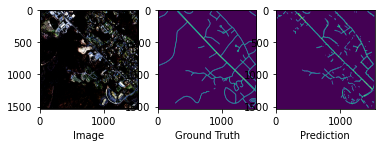

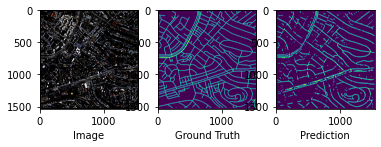

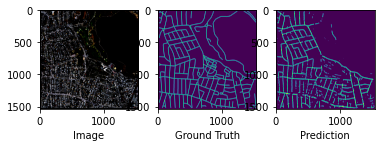

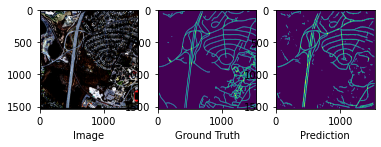

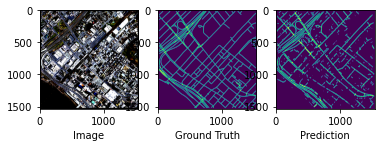

...

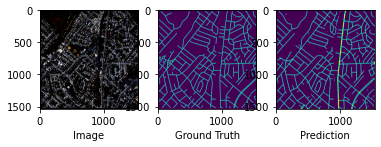

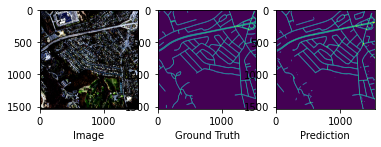

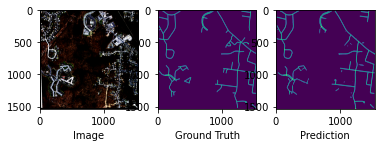

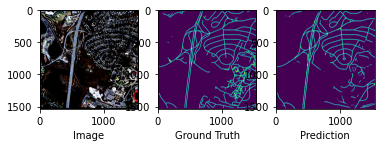

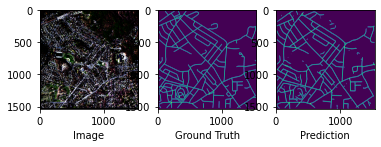

In [19]:
train_loss_values = []
valid_loss_values = []
train_iou_values = []
valid_iou_values = []

for epoch in range(200):
    loop = tqdm(train_loader)
    train_losses = []
    train_iou = []
    # training_loop
    model.train()
    for batch_id, (images, masks) in enumerate(loop):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float().unsqueeze(1)
        
        outputs = model(images)
        

        loss = criterion(outputs, masks)
        train_losses.append(loss.item())
        
        iou = mIoU(outputs, masks)
        train_iou.append(iou)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loop.set_postfix(train_loss=loss.item(), train_miou=iou)
        
    # Validation loop    
    model.eval()
    valid_losses = []
    valid_iou = []

    with torch.no_grad():
        loop = tqdm(valid_loader)
        for i, (images, masks) in enumerate(loop):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            masks = masks.float().unsqueeze(1)

            outputs = model(images)
            
            if (epoch+1) % 10 == 0:
                img = images[0].permute(1, 2, 0).cpu()
                mask = masks[0].squeeze(0).cpu()
                preds = torch.sigmoid(outputs)
                preds = (preds > 0.5).float()
                pred = preds[0].cpu().squeeze(0)

                plot_images(img, mask, pred)
            
            val_loss = criterion(outputs, masks)
            valid_losses.append(val_loss.item())

            val_iou = mIoU(outputs, masks)
            valid_iou.append(val_iou)
            
            loop.set_postfix(valid_loss=val_loss.item(), valid_miou=val_iou)
                
        
        
    scheduler.step()
        
    train_loss_values.append(np.mean(train_losses))
    valid_loss_values.append(np.mean(valid_losses))
    train_iou_values.append(np.mean(train_iou))
    valid_iou_values.append(np.mean(valid_iou))
    
    
    if (epoch+1) % 10 == 0:
        torch.save(model.state_dict(), "resunet_cosine.pt")
        
        
        
        
    print(f"Epoch-{epoch+1} Train mean loss: {np.mean(train_losses):.4f} Train MIOU: {np.mean(train_iou):.4f}")
    print(f"Epoch-{epoch+1} Valid mean loss: {np.mean(valid_losses):.4f} Valid MIOU: {np.mean(valid_iou):.4f}")

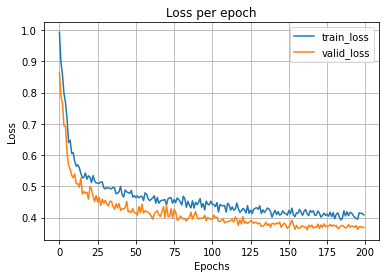

In [20]:
#Plotting Loss
plt.plot(train_loss_values, label='train_loss')
plt.plot(valid_loss_values, label='valid_loss')
plt.title('Loss per epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

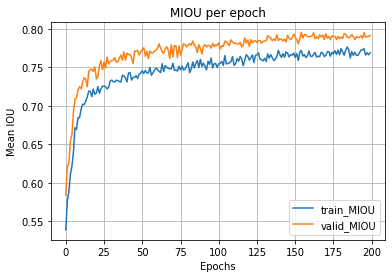

In [21]:
# Plotting Mean IOU
plt.plot(train_iou_values, label='train_MIOU')
plt.plot(valid_iou_values, label='valid_MIOU')
plt.title('MIOU per epoch')
plt.xlabel('Epochs')
plt.ylabel('Mean IOU')
plt.legend()
plt.grid()
plt.show()

In [18]:
# Image size = 1536
# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
weights = torch.load("resunet_cosine.pt", map_location=DEVICE)
model.load_state_dict(weights)



def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy


model.eval()
with torch.no_grad():
    total_list = []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).squeeze(1).long()
        
        outputs = model(images)
        miou_list = mIoU(pred_mask = outputs, mask=masks, n_classes=2) 
        total_list.append(miou_list)
print(np.mean(total_list))

  0%|          | 0/49 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 49/49 [00:12<00:00,  4.06it/s]

0.8056152003788452


In [19]:
# Image size = 1504
# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
weights = torch.load("resunet_cosine.pt", map_location=DEVICE)
model.load_state_dict(weights)



def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy


model.eval()
with torch.no_grad():
    total_list = []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).squeeze(1).long()
        
        outputs = model(images)
        miou_list = mIoU(pred_mask = outputs, mask=masks, n_classes=2) 
        total_list.append(miou_list)
print(np.mean(total_list))

  0%|          | 0/49 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 49/49 [00:12<00:00,  4.03it/s]

0.8100966888007355


In [20]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor
unnorm = UnNormalize(mean=[0.4299, 0.4328, 0.3964], std=[0.2711, 0.2666, 0.2816])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

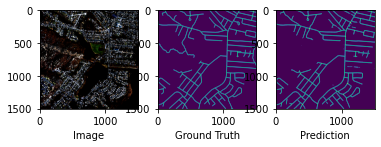

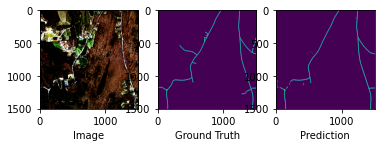

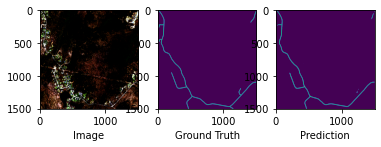

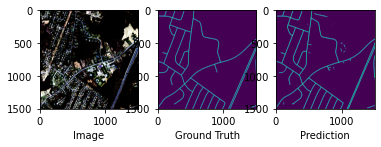

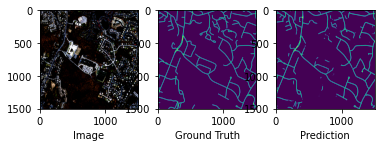

...

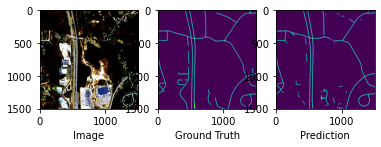

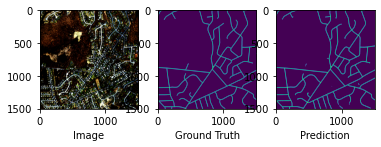

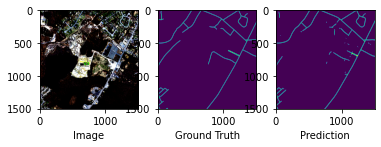

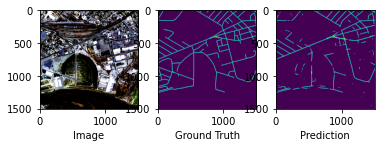

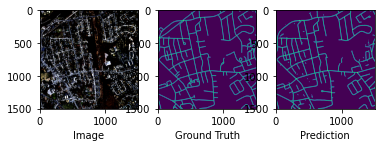

In [22]:
with torch.no_grad():
    model.eval()
    folder = 'Image_results/ResUnet'
    for i, data in enumerate(test_set):
        images, masks = data
        images = images.unsqueeze(0).to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float()

        outputs = model(images)

        img = images.squeeze(0).permute(1, 2, 0).cpu()
        mask = masks.squeeze(0).cpu()
        preds = torch.sigmoid(outputs)
        preds = (preds > 0.5).float()
        pred = preds[0].cpu().squeeze(0)
        pred[pred == 1] = 255
        
        image = unnorm(images)
        torchvision.utils.save_image(image, f"{folder}/image_{i}.png")
        torchvision.utils.save_image(masks, f"{folder}/mask_{i}.png")
        torchvision.utils.save_image(pred, f"{folder}/pred_{i}.png")

        plot_images(img, mask, pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


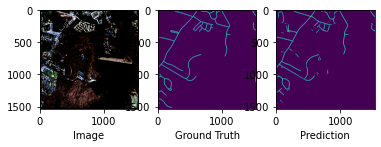

In [22]:
with torch.no_grad():
    model.eval()
    images, masks = test_set[20]
    images = images.unsqueeze(0).to(DEVICE)
    masks = masks.to(DEVICE)
    masks = masks.float()

    outputs = model(images)

    img = images.squeeze(0).permute(1, 2, 0).cpu()
    mask = masks.squeeze(0).cpu()
    preds = torch.sigmoid(outputs)
    preds = (preds > 0.5).float()
    pred = preds[0].cpu().squeeze(0)

    plot_images(img, mask, pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


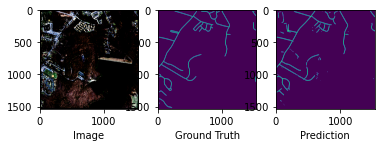

In [23]:
with torch.no_grad():
    model.eval()
    images, masks = test_set[20]
    images = images.unsqueeze(0).to(DEVICE)
    masks = masks.to(DEVICE)
    masks = masks.float()

    outputs = model(images)

    img = images.squeeze(0).permute(1, 2, 0).cpu()
    mask = masks.squeeze(0).cpu()
    preds = torch.sigmoid(outputs)
    preds = (preds > 0.5).float()
    pred = preds[0].cpu().squeeze(0)

    plot_images(img, mask, pred)
   

In [19]:
# Image Size = 1536
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images).squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 49/49 [02:00<00:00,  2.45s/it]

 MIOU: 0.8056152003788454, P: 0.8976631760597229, R: 0.8670259714126587, F1: 0.8800992369651794


In [23]:
# Image Size = 1504
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images).squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 49/49 [02:03<00:00,  2.53s/it]

 MIOU: 0.8100966888007355, P: 0.9021360278129578, R: 0.8686526417732239, F1: 0.8830849528312683


In [24]:
from torchinfo import summary
summary(model, input_size=(1, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
ResUnet                                  --                        --
├─Conv2d: 1-1                            [1, 64, 256, 256]         1,792
├─batchnorm_relu: 1-2                    [1, 64, 256, 256]         --
│    └─BatchNorm2d: 2-1                  [1, 64, 256, 256]         128
│    └─ReLU: 2-2                         [1, 64, 256, 256]         --
├─Conv2d: 1-3                            [1, 64, 256, 256]         36,928
├─Conv2d: 1-4                            [1, 64, 256, 256]         256
├─residual_block: 1-5                    [1, 128, 128, 128]        --
│    └─batchnorm_relu: 2-3               [1, 64, 256, 256]         --
│    │    └─BatchNorm2d: 3-1             [1, 64, 256, 256]         128
│    │    └─ReLU: 3-2                    [1, 64, 256, 256]         --
│    └─Conv2d: 2-4                       [1, 128, 128, 128]        73,856
│    └─batchnorm_relu: 2-5               [1, 128, 128, 128]        --
│